In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import altair as alt

In [2]:
pd.options.display.max_columns = 999

## Week 9B: OpenStreetMap, Urban Networks, and Interactive Web Maps
Nov 2, 2022

## The final project

https://github.com/MUSA-550-Fall-2022/final-project

## This week: OpenStreetMap (OSM)

Three parts:
- **OSMnx:** downloading and manipulating streets as networks
- **Pandana:** networks focused on accessibility of amenities, e.g., walking distances to the nearest amenities
- **Related:** interactive web maps in Python



In [3]:
import osmnx as ox

## Part 3: Interactive maps in Python

Haven't we already done this?

## Yes!

We've used hvplot, holoviews, datashader, etc. to create interactive map-based visualizations

## Why do we need something more?

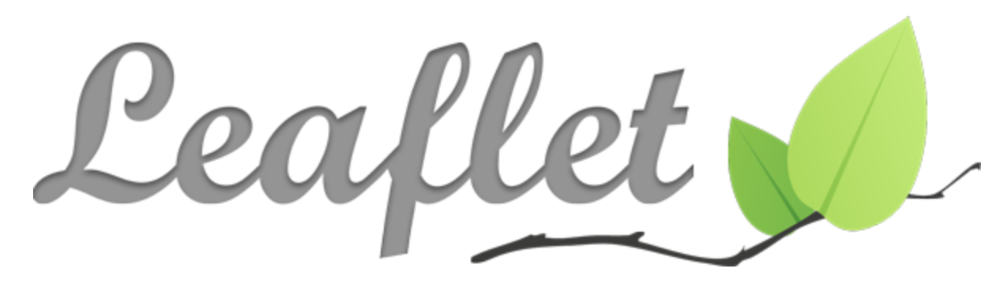</img>

## The benefits of Leaflet

- The leading open-source mapping library
- Simple and powerful
- Leverage the open-source community and lots of powerful plugins

## Folium: Leaflet in Python

**Pros**
- Create Leaflet.js maps directly from Python
- Combine power of Leaflet.js with the data wrangling ease of Python

**Cons**
- A wrapper for **most, but not all** of Leaflet's functionality
- Can be difficult to debug and find errors

## Revisiting routing with OSMnx

OSMnx leverages Folium under the hood to make interactive graphs of street networks!

**Key function:** `ox.plot_graph_folium` will make an interactive map of the graph object

Load the street network around City Hall

In [4]:
G = ox.graph_from_address('City Hall, Philadelphia, USA', 
                          dist=1500, 
                          network_type='drive')

In [5]:
# plot the street network with folium
graph_map = ox.plot_graph_folium(G, 
                                 popup_attribute='name', 
                                 edge_width=2)

In [6]:
graph_map

And now save the map object and load it into the Jupyter notebook

In [7]:
from IPython.display import IFrame # loads HTML files

In [8]:
filepath = 'graph.html'
graph_map.save(filepath)
IFrame(filepath, width=600, height=500)

### Note

Folium map objects are *supposed* to render automatically in the Jupyter notebook, so if you output a Folium map from a notebook cell, it will render. 

However, there a lot of times when the map won't show up properly, especially if the map has a large amount of data. Saving the file locally and loading it to the notebook via an IFrame will always work.

In [9]:
type(graph_map)

folium.folium.Map

In [10]:
graph_map

## Exercise: shortest route between the Liberty Bell and Art Museum

Let's calculate the shortest route between [the Art Museum](https://www.openstreetmap.org/way/28533972) and the [Liberty Bell](https://www.openstreetmap.org/node/1207480649).

See last lecture (Lecture 9A) for a guide!

### Step 1: Download amenity info from OSM using OSMnx

Use OSMnx to download all amenities in Philadelphia of type "tourism".

- The `ox.geometries_from_place()` can download OSM features with a specific tag
- Consult the OSM pages ([the Art Museum](https://www.openstreetmap.org/way/28533972) and [Liberty Bell](https://www.openstreetmap.org/node/1207480649)) for each feature for additional info
- Both features are categorized as "tourism" in the OSM data — use the "tags" keyword to select this category

In [11]:
philly_tourism = ox.geometries_from_place("Philadelphia, PA", tags={"tourism": True})

In [12]:
len(philly_tourism)

505

In [13]:
philly_tourism.head()

ref                    geometry  ele gnis:county_id  \
element_type osmid                                                            
node         357371322  NaN  POINT (-75.19580 39.96970)   17            101   
             360500844  NaN  POINT (-75.19582 39.95352)  NaN            NaN   
             360542779  NaN  POINT (-75.18932 39.95540)  NaN            NaN   
             360777728  NaN  POINT (-75.19021 39.95230)  NaN            NaN   
             360777735  NaN  POINT (-75.19166 39.95123)  NaN            NaN   

                       gnis:created gnis:feature_id gnis:state_id  \
element_type osmid                                                  
node         357371322   08/23/2007         2347097            42   
             360500844          NaN             NaN           NaN   
             360542779          NaN             NaN           NaN   
             360777728          NaN             NaN           NaN   
             360777735          NaN             NaN           NaN   

                                                                     name  \
element_type osmid                                                          
node         357371322                              Bird Lake Picnic Area   
             360500844                                 Hilton Inn at Penn   
             360542779                              Mario the Magnificent   
             360777728  Pennsylvania Historical Marker: ENIAC, first a...   
             360777735                             John Harrison, Chemist   

                            tourism   brand brand:wikidata  \
element_type osmid                                           
node         357371322  picnic_site     NaN            NaN   
             360500844        hotel  Hilton        Q598884   
             360542779      artwork     NaN            NaN   
             360777728  information     NaN            NaN   
             360777735      artwork     NaN            NaN   

                                   brand:wikipedia operator artwork_type  \
element_type osmid                                                         
node         357371322                         NaN      NaN          NaN   
             360500844  en:Hilton Hotels & Resorts   Hilton          NaN   
             360542779                         NaN      NaN       statue   
             360777728                         NaN      NaN          NaN   
             360777735                         NaN      NaN       statue   

                         wikidata information addr:state gnis:county_name  \
element_type osmid                                                          
node         357371322        NaN         NaN        NaN              NaN   
             360500844        NaN         NaN        NaN              NaN   
             360542779  Q98563440         NaN        NaN              NaN   
             360777728        NaN       board        NaN              NaN   
             360777735        NaN         NaN        NaN              NaN   

                       gnis:import_uuid gnis:reviewed source  fee  \
element_type osmid                                                  
node         357371322              NaN           NaN    NaN  NaN   
             360500844              NaN           NaN    NaN  NaN   
             360542779              NaN           NaN    NaN  NaN   
             360777728              NaN           NaN    NaN  NaN   
             360777735              NaN           NaN    NaN  NaN   

                       opening_hours artist_name wheelchair wikipedia  \
element_type osmid                                                      
node         357371322           NaN         NaN        NaN       NaN   
             360500844           NaN         NaN        NaN       NaN   
             360542779           NaN         NaN        NaN       NaN   
             360777728           NaN         NaN        NaN       NaN   
             360

### Step 2: Identify the Art Museum and Liberty Bell geometries

You should notice we have the building footprint for the Art Museum (a polygon geometry) and the point location for the Liberty Bell.

- The names of the features are "Philadelphia Museum of Art" and "Liberty Bell" — you can identify these names using the OSM website
- The `.squeeze()` function can be useful for converting to a Series object from a DataFrame of length 1

In [14]:
# How to find the name of the POI: search for keywords
philly_tourism.loc[philly_tourism['name'].str.contains("Art", na=False)]

ref  \
element_type osmid             
node         367974278   NaN   
             4064343335  NaN   
             5368454121  NaN   
             5718906477  NaN   
             6639391809  NaN   
             6680708848  NaN   
way          28533972    NaN   
             333931830   NaN   
             988345364   NaN   

                                                                  geometry  \
element_type osmid                                                           
node         367974278                          POINT (-75.15240 40.03748)   
             4064343335                         POINT (-75.22112 40.02427)   
             5368454121                         POINT (-75.19477 39.95406)   
             5718906477                         POINT (-75.13058 39.99573)   
             6639391809                         POINT (-75.16088 39.96383)   
             6680708848                         POINT (-75.16833 39.94733)   
way          28533972    POLYGON ((-75.18116 39.96467, -75.18138 39.964...   
             333931830   POLYGON ((-75.16410 39.95543, -75.16416 39.955...   
             988345364   POLYGON ((-75.21924 40.08337, -75.21934 40.083...   

                         ele gnis:county_id gnis:created gnis:feature_id  \
element_type osmid                                                         
node         367974278    61            NaN          NaN         2349240   
             4064343335  NaN            NaN          NaN             NaN   
             5368454121  NaN            NaN          NaN             NaN   
             5718906477  NaN            NaN          NaN             NaN   
             6639391809  NaN            NaN          NaN             NaN   
             6680708848  NaN            NaN          NaN             NaN   
way          28533972     32            NaN          NaN             NaN   
             333931830    13            NaN          NaN         1196718   
             988345364    84            NaN          NaN         2350852   

                        gnis:state_id                                   name  \
element_type osmid                                                             
node         367974278            NaN         La Salle University Art Museum   
             4064343335           NaN             Soft Illusions Art Gallery   
             5368454121           NaN          Institute of Contemporary Art   
             5718906477           NaN             Art Making Machine Studios   
             6639391809           NaN      Philadelphia Museum of Jewish Art   
             6680708848           NaN               Romanian Folk Art Museum   
way          28533972             NaN             Philadelphia Museum of Art   
             333931830            NaN  Pennsylvania Academy of the Fine Arts   
             988345364            NaN                    Woodmere Art Museum   

                         tourism brand brand:wikidata brand:wikipedia  \
element_type osmid                                                      
node         367974278    museum   NaN            NaN             NaN   
             4064343335  gallery   NaN            NaN             NaN   
             5368454121   museum   NaN            NaN             NaN   
             5718906477  gallery   NaN            NaN             NaN   
             6639391809   museum   NaN            NaN             NaN   
             6680708848   museum   NaN            NaN             NaN   
way          28533972     museum   NaN            NaN             NaN   
             333931830    museum   NaN            NaN             NaN   
             988345364    museum   NaN            NaN             NaN   

                        operator artwork_type    wikidata information  \
element_type osmid                                                      
node         367974278       NaN          NaN   Q16893816         NaN   
             4064343335      NaN          NaN         NaN         NaN   

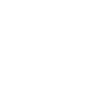

In [15]:
art_museum = philly_tourism.query("name == 'Philadelphia Museum of Art'").squeeze()

art_museum.geometry

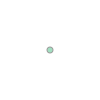

In [16]:
liberty_bell = philly_tourism.query("name == 'Liberty Bell'").squeeze()

liberty_bell.geometry

### Step 3: Extract the lat and lng coordinates

For the Art Museum geometry, we can use the `.geometry.centroid` attribute to calculate the centroid of the building footprint. 

**Remember:** we need the coordinates in the order of (latitude, longitude)

In [17]:
liberty_bell_x = liberty_bell.geometry.x
liberty_bell_y = liberty_bell.geometry.y

In [18]:
art_museum_x = art_museum.geometry.centroid.x
art_museum_y = art_museum.geometry.centroid.y

### Step 4: Find the nearest nodes on our OSMnx graph

Use the street network graph around City Hall and the `ox.get_nearest_node()` function to find the starting and ending nodes for the trip.

In [19]:
# Get the origin node
orig_node = ox.distance.nearest_nodes(G, liberty_bell_x, liberty_bell_y) 

# Get the destination node
dest_node = ox.distance.nearest_nodes(G, art_museum_x, art_museum_y) 

### Step 5: Use `networkx` to find the shortest path between nodes

The `nx.shortest_path()` will do the calculation for you!

In [20]:
import networkx as nx

In [21]:
# Calculate the shortest path between these nodes
route = nx.shortest_path(G, orig_node, dest_node)

In [22]:
route

[3408446156,
 110217312,
 109814427,
 109825548,
 109825559,
 109809258,
 109825575,
 109825606,
 109789819,
 775433860,
 110232279,
 646149049,
 110232451,
 109755755,
 109744095,
 109792682,
 775896555,
 775896556,
 110329757,
 110329738,
 110329851,
 110125895,
 534969088,
 109745905,
 109740423,
 110330569,
 550175455,
 550175399]

## Example: interactive maps of network routes

Now, we can overlay the shortest route between two nodes on the folium map.

**Key function**: use `ox.plot_route_folium` to plot the route.

In [23]:
# plot the route with folium
route_map = ox.plot_route_folium(G, route)

In [24]:
filepath = 'route.html'
route_map.save(filepath)
IFrame(filepath, width=600, height=500)

We can also add the underlying street network graph

In [25]:
# plot the route with folium on top of the previously created graph_map
route_graph_map = ox.plot_route_folium(G, route, route_map=graph_map, color="red", weight=5,)

In [28]:
# save as html file then display map as an iframe
filepath = 'route_graph.html'
route_graph_map.save(filepath)
IFrame(filepath, width=600, height=500)

Note the `Leaflet` annotation in the bottom right corner of the maps...

## Getting started with Folium

**Things we'll cover:**
1. Creating a base map with tiles
1. Overlaying GeoJSON polygons
1. Plotting an interactive choropleth

In [29]:
import folium

## 3.1 Creating a Folium map

**Key function:** `folium.Map`

### Lots of configuration options

Some key ones: 
- **location**: the center location of the map
- **zoom_start**: the initial zoom level of the map
- **tiles**: the name of the tile provider 

Let's take a look at the help message:

In [30]:
folium.Map?

Init signature:
folium.Map(
    location=None,
    width='100%',
    height='100%',
    left='0%',
    top='0%',
    position='relative',
    tiles='OpenStreetMap',
    attr=None,
    min_zoom=0,
    max_zoom=18,
    zoom_start=10,
    min_lat=-90,
    max_lat=90,
    min_lon=-180,
    max_lon=180,
    max_bounds=False,
    crs='EPSG3857',
    control_scale=False,
    prefer_canvas=False,
    no_touch=False,
    disable_3d=False,
    png_enabled=False,
    zoom_control=True,
    **kwargs,
)
Docstring:     
Create a Map with Folium and Leaflet.js

Generate a base map of given width and height with either default
tilesets or a custom tileset URL. The following tilesets are built-in
to Folium. Pass any of the following to the "tiles" keyword:

    - "OpenStreetMap"
    - "Mapbox Bright" (Limited levels of zoom for free tiles)
    - "Mapbox Control Room" (Limited levels of zoom for free tiles)
    - "Stamen" (Terrain, Toner, and Watercolor)
    - "Cloudmade" (Must pass API key)
    - "Mapb

### The default tiles: OpenStreetMap

In [31]:
# let's center the map on Philadelphia
m = folium.Map(
    location=[39.99, -75.13],
    zoom_start=11
)

m

In [32]:
m = folium.Map(
    location=[39.99, -75.13],
    zoom_start=11,
     tiles='stamenwatercolor'
)

m

### Using custom tile sets

- Many sites provide free tile sets for download
- Just need the URL of the tile server
- Very useful demo of tile providers: https://leaflet-extras.github.io/leaflet-providers/preview

Let's try out the ESRI World Map:

**Important: for custom tile providers, you need to specify the attribution too!** 

In [33]:
tile_url = 'https://{s}.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png'
attr = '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors &copy; <a href="https://carto.com/attributions">CARTO</a>'

In [34]:
m = folium.Map(
    location=[39.99, -75.13],
    zoom_start=11,
    tiles=tile_url,
    attr=attr
)

m

## 3.2 Overlaying GeoJSON on a folium map

**Key function:** `folium.GeoJson`

**Key parameters:**
- `style_function`: set the default style of the features
- `highlight_function`: set the style when the mouse hovers over the features 
- `tooltip`: add a tooltip when hovering over a feature

In [35]:
folium.GeoJson?

Init signature:
folium.GeoJson(
    data,
    style_function=None,
    highlight_function=None,
    name=None,
    overlay=True,
    control=True,
    show=True,
    smooth_factor=None,
    tooltip=None,
    embed=True,
    popup=None,
    zoom_on_click=False,
    marker=None,
)
Docstring:     
Creates a GeoJson object for plotting into a Map.

Parameters
----------
data: file, dict or str.
    The GeoJSON data you want to plot.
    * If file, then data will be read in the file and fully
    embedded in Leaflet's JavaScript.
    * If dict, then data will be converted to JSON and embedded
    in the JavaScript.
    * If str, then data will be passed to the JavaScript as-is.
    * If `__geo_interface__` is available, the `__geo_interface__`
    dictionary will be serialized to JSON and
    reprojected if `to_crs` is available.
style_function: function, default None
    Function mapping a GeoJson Feature to a style dict.
highlight_function: function, default None
    Function mapping a Ge

In [36]:
folium.GeoJsonTooltip?

Init signature:
folium.GeoJsonTooltip(
    fields,
    aliases=None,
    labels=True,
    localize=False,
    style=None,
    class_name='foliumtooltip',
    sticky=True,
    **kwargs,
)
Docstring:     
Create a tooltip that uses data from either geojson or topojson.

Parameters
----------
fields: list or tuple.
    Labels of GeoJson/TopoJson 'properties' or GeoPandas GeoDataFrame
    columns you'd like to display.
aliases: list/tuple of strings, same length/order as fields, default None.
    Optional aliases you'd like to display in the tooltip as field name
    instead of the keys of `fields`.
labels: bool, default True.
    Set to False to disable displaying the field names or aliases.
localize: bool, default False.
    This will use JavaScript's .toLocaleString() to format 'clean' values
    as strings for the user's location; i.e. 1,000,000.00 comma separators,
    float truncation, etc.
    Available for most of JavaScript's primitive types (any data you'll
    serve into the tem

### Example: Philadelphia ZIP codes & Neighborhoods

In [37]:
# Load neighborhoods from GitHub
url = "https://github.com/azavea/geo-data/raw/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson"
hoods = gpd.read_file(url).rename(columns={"mapname": "neighborhood"})

In [38]:
# Load ZIP codes from Open Data Philly
zip_url = "http://data.phl.opendata.arcgis.com/datasets/b54ec5210cee41c3a884c9086f7af1be_0.geojson"
zip_codes = gpd.read_file(zip_url).rename(columns={"CODE":"ZIP Code"})

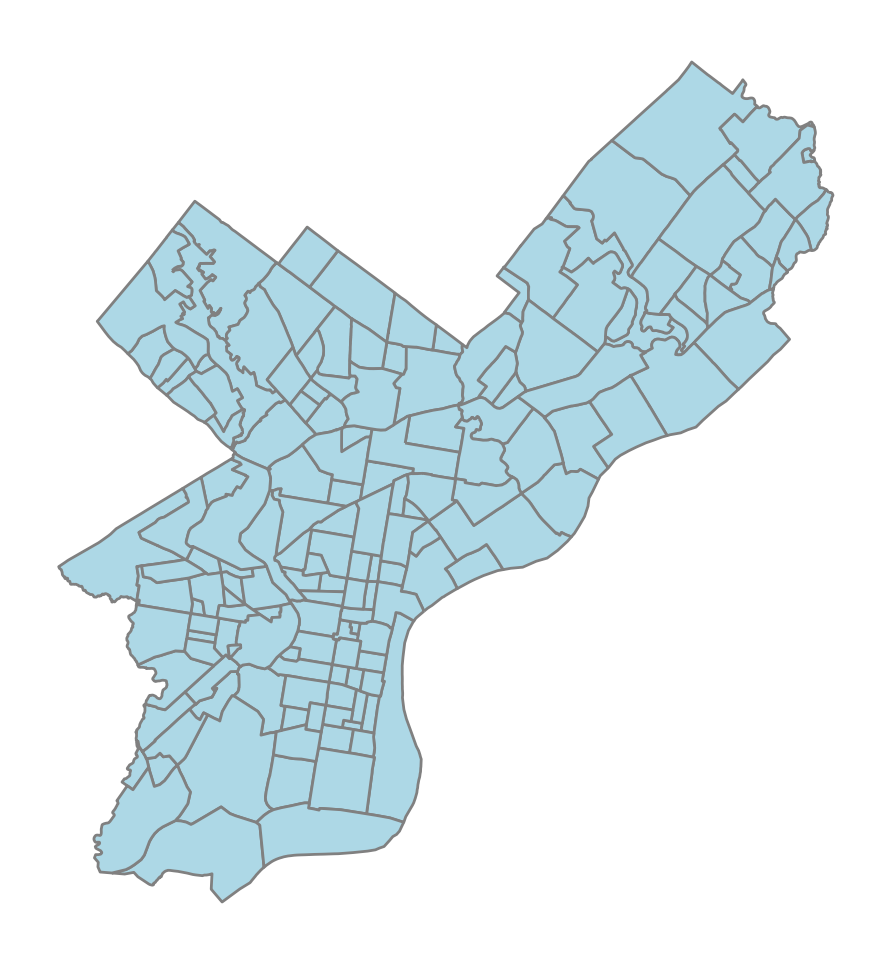

In [39]:
ax = ox.project_gdf(hoods).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

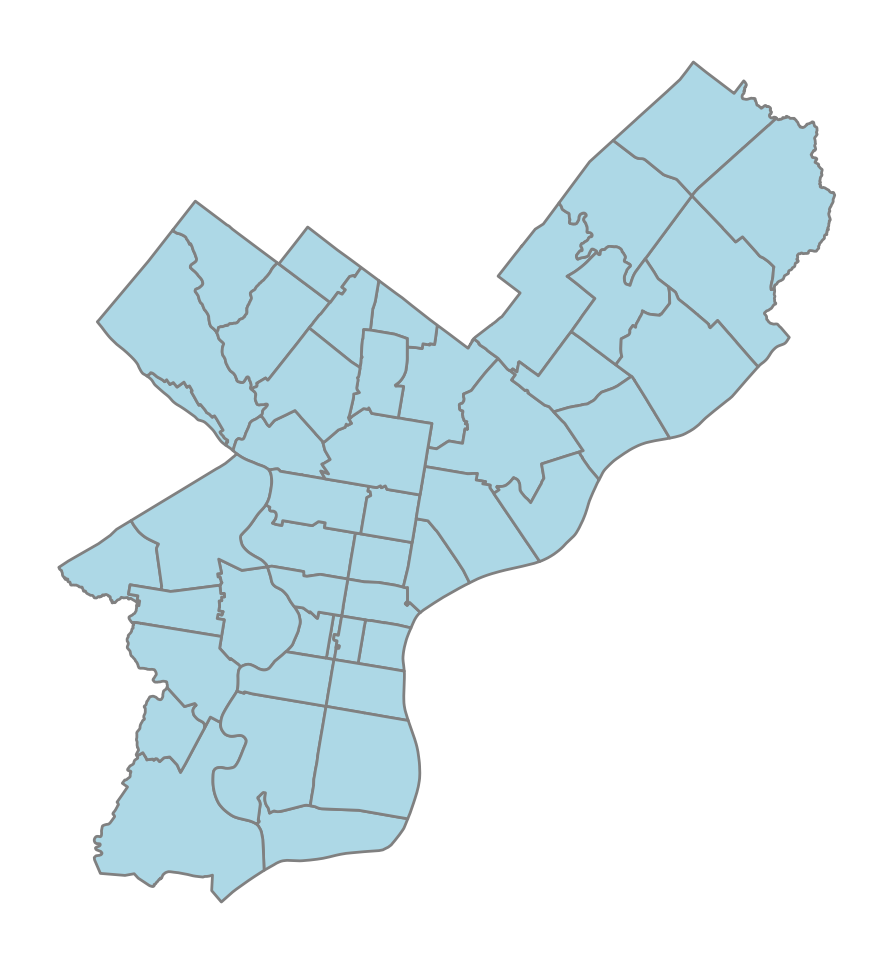

In [40]:
ax = ox.project_gdf(zip_codes).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

Define functions to set the styles:

In [41]:
def get_zip_code_style(feature):
    """Return a style dict."""
    return {"weight": 2, "color": "white"}


def get_neighborhood_style(feature):
    """Return a style dict."""
    return {"weight": 2, "color": "lightblue", "fillOpacity": 0.1}


def get_highlighted_style(feature):
    """Return a style dict when highlighting a feature."""
    return {"weight": 2, "color": "red"}

### Usual Leaflet/Folium syntax

1. Create the map
2. Create your overlay layer
3. Add your overlay layer to your map

In [42]:
# Create the map
m = folium.Map(
    location=[39.99, -75.13],
    tiles='Cartodb dark_matter',
    zoom_start=11
)

# Add the ZIP Codes GeoJson to the map
folium.GeoJson(
    zip_codes.to_crs(epsg=4326), # IMPORTANT: make sure CRS is lat/lng (EPSG=4326)
    name='Philadelphia ZIP_codes',
    style_function=get_zip_code_style,
    highlight_function=get_highlighted_style,
    tooltip=folium.GeoJsonTooltip(['ZIP Code'])
).add_to(m)


# Add a SECOND layer for neighborhoods
folium.GeoJson(
    hoods.to_crs(epsg=4326), # IMPORTANT: make sure CRS is lat/lng (EPSG=4326)
    name='Neighborhoods',
    style_function=get_neighborhood_style,
    highlight_function=get_highlighted_style,
    tooltip=folium.GeoJsonTooltip(['neighborhood'])
).add_to(m)


# Also add option to toggle layers
folium.LayerControl().add_to(m)

m

## Important notes:

- The data should be passed as GeoJSON rather than a GeoDataFrame — you need to call `.to_json()`
- I've added a `LayerControl` to toggle different layers on the map
- I've specified a tooltip using `folium.GeoJsonTooltip`

## 3.3 Plotting a choropleth map

Overlay GeoJSON features on an interactive map, colored by a specific data variable

## At-home exercise: load data for internet availability in US counties

In the interest of time, I've used `cenpy` to download data for internet availability from the 2019 5-year ACS, but a good at-home exercise is to try to replicate my work. 

- The relevant data table is [B28002: PRESENCE AND TYPES OF INTERNET SUBSCRIPTIONS IN HOUSEHOLD](https://data.census.gov/cedsci/table?q=B28002&tid=ACSDT5Y2019.B28002&hidePreview=false)
- Columns: 
    - B28002_001E: the total universe of households
    - B28002_013E: households without internet

In [43]:
census_data = pd.read_csv("./data/internet_avail_census.csv", dtype={"geoid": str})

In [44]:
census_data.head()

,NAME,universe,no_internet,state,county,geoid
0,"Washington County, Mississippi",18299.0,6166.0,28,151,28151
1,"Perry County, Mississippi",4563.0,1415.0,28,111,28111
2,"Choctaw County, Mississippi",3164.0,1167.0,28,19,28019
3,"Itawamba County, Mississippi",8706.0,1970.0,28,57,28057
4,"Carroll County, Mississippi",3658.0,1218.0,28,15,28015


In [45]:
# Remove counties with no households
valid = census_data['universe'] > 0
census_data = census_data.loc[valid]

# Calculate the percent without internet
census_data['percent_no_internet'] = census_data['no_internet'] / census_data['universe']

In [46]:
census_data.head()

,NAME,universe,no_internet,state,county,geoid,percent_no_internet
0,"Washington County, Mississippi",18299.0,6166.0,28,151,28151,0.336958
1,"Perry County, Mississippi",4563.0,1415.0,28,111,28111,0.310103
2,"Choctaw County, Mississippi",3164.0,1167.0,28,19,28019,0.368837
3,"Itawamba County, Mississippi",8706.0,1970.0,28,57,28057,0.226281
4,"Carroll County, Mississippi",3658.0,1218.0,28,15,28015,0.332969


Load counties from the data folder as well:

In [47]:
counties = gpd.read_file("./data/us-counties-10m.geojson")

In [48]:
counties.head()

,id,geometry
0,53073,"MULTIPOLYGON (((-120.85361 49.00011, -120.7674..."
1,30105,"POLYGON ((-106.11238 48.99904, -106.15187 48.8..."
2,30029,"POLYGON ((-114.06985 48.99904, -114.05908 48.8..."
3,16021,"POLYGON ((-116.04755 49.00065, -116.04755 48.5..."
4,30071,"POLYGON ((-107.17840 49.00011, -107.20712 48.9..."


## Now let's make the choropleth...

## The easy way: use folium.Choropleth

- **The good:** 
    - Automatically generate a choropleth from a set of features and corresponding pandas DataFrame
    - Automatic creation of a legend
- **The bad:** 
    - no tooltip and little highlight interactivity (currently being worked on)

In [49]:
folium.Choropleth?

Init signature:
folium.Choropleth(
    geo_data,
    data=None,
    columns=None,
    key_on=None,
    bins=6,
    fill_color=None,
    nan_fill_color='black',
    fill_opacity=0.6,
    nan_fill_opacity=None,
    line_color='black',
    line_weight=1,
    line_opacity=1,
    name=None,
    legend_name='',
    overlay=True,
    control=True,
    show=True,
    topojson=None,
    smooth_factor=None,
    highlight=None,
    **kwargs,
)
Docstring:     
Apply a GeoJSON overlay to the map.

Plot a GeoJSON overlay on the base map. There is no requirement
to bind data (passing just a GeoJSON plots a single-color overlay),
but there is a data binding option to map your columnar data to
different feature objects with a color scale.

If data is passed as a Pandas DataFrame, the "columns" and "key-on"
keywords must be included, the first to indicate which DataFrame
columns to use, the second to indicate the layer in the GeoJSON
on which to key the data. The 'columns' keyword does not need to be
pa

Steps:

1. Pass the geometry data (counties) as GeoJSON **in lat/lng CRS**
1. Pass in the census data separately
1. Pass in the column that we match the geometries on (`key_on=`), using the GeoJSON "features.properties." syntax
1. Pass the data *key* (column to match the data on) and the data *value* (the column to color the geometries by) via the `columns=` keyword

In [50]:
m = folium.Map(location=[40, -98], zoom_start=4)

# Convert the counties geometries into GeoJSON
counties_geojson = counties.to_crs(epsg=4326)

folium.Choropleth(
    geo_data=counties_geojson, # Pass in GeoJSON data for counties
    data=census_data, # the census data
    columns=["geoid", 'percent_no_internet'], # First column must be the key, second the values
    key_on="feature.properties.id", # Key to match on in the geometries --> Remember to prepend "feature.properties"
    fill_color='RdPu', # any ColorBrewer name will work here
    fill_opacity=0.7,
    line_opacity=1,
    line_weight=0.5,
    legend_name='Households without Internet (%)',
    name='choropleth',
).add_to(m)


m

## The hard way: use folium.GeoJson

- **The good:**
    - More customizable, and can add user interaction
- **The bad:**
    - Requires more work
    - No way to add a legend, see [this open issue on GitHub](https://github.com/python-visualization/folium/issues/528)

## The steps involved

1. Join data and geometry features into a single GeoDataFrame
1. Define a function to style features based on data values
1. Create GeoJSON layer and add it to the map

### Step 1: Join the census data and features

**Note:** this is different than using `folium.Choropleth`, where data and features are stored in two separate data frames.

In [51]:
# Merge the county geometries with census data
# Left column: "id"
# Right column: "geoid"
census_joined = counties.merge(census_data, left_on="id", right_on="geoid")

In [52]:
census_joined.head()

,id,geometry,NAME,universe,no_internet,state,county,geoid,percent_no_internet
0,53073,"MULTIPOLYGON (((-120.85361 49.00011, -120.7674...","Whatcom County, Washington",85008.0,9189.0,53,73,53073,0.108096
1,30105,"POLYGON ((-106.11238 48.99904, -106.15187 48.8...","Valley County, Montana",3436.0,672.0,30,105,30105,0.195576
2,30029,"POLYGON ((-114.06985 48.99904, -114.05908 48.8...","Flathead County, Montana",38252.0,5662.0,30,29,30029,0.148018
3,16021,"POLYGON ((-116.04755 49.00065, -116.04755 48.5...","Boundary County, Idaho",4605.0,1004.0,16,21,16021,0.218024
4,30071,"POLYGON ((-107.17840 49.00011, -107.20712 48.9...","Phillips County, Montana",1770.0,484.0,30,71,30071,0.273446


### Step 2: Normalize the data column to 0 to 1

- We will use a matplotlib color map that requires data to be between 0 and 1
- Normalize our "percent_no_internet" column to be between 0 and 1

In [53]:
# Minimum
min_val = census_joined['percent_no_internet'].min()

# Maximum
max_val = census_joined['percent_no_internet'].max()

# Calculate a normalized column
normalized = (census_joined['percent_no_internet'] - min_val) / (max_val - min_val)

# Add to the dataframe
census_joined['percent_no_internet_normalized'] = normalized

### Step 3: Define our style functions

- Create a matplotlib colormap object using `plt.get_cmap()`
- Color map objects are *functions*: give the function a number between 0 and 1 and it will return a corresponding color from the color map
- Based on the feature data, evaluate the color map and convert to a hex string

In [54]:
import matplotlib.colors as mcolors

In [55]:
# Use a red-purple colorbrewer color scheme
cmap = plt.get_cmap('RdPu')

In [56]:
# The minimum value of the color map as an RGB tuple
cmap(0)

(1.0, 0.9686274509803922, 0.9529411764705882, 1.0)

In [57]:
# The minimum value of the color map as a hex string
mcolors.rgb2hex(cmap(0.0))

'#fff7f3'

In [58]:
# The maximum value of the color map as a hex string
mcolors.rgb2hex(cmap(1.0))

'#49006a'

In [59]:
def get_style(feature):
    """
    Given an input GeoJSON feature, return a style dict.
    
    Notes
    -----
    The color in the style dict is determined by the 
    "percent_no_internet_normalized" column in the 
    input "feature".
    """
    # Get the data value from the feature
    value = feature['properties']['percent_no_internet_normalized']
    
    # Evaluate the color map
    # NOTE: value must between 0 and 1
    rgb_color = cmap(value) # this is an RGB tuple
    
    # Convert to hex string
    color = mcolors.rgb2hex(rgb_color)
    
    # Return the style dictionary
    return {'weight': 0.5, 'color': color, 'fillColor': color, "fillOpacity": 0.75}

In [60]:
def get_highlighted_style(feature):
    """
    Return a style dict to use when the user highlights a 
    feature with the mouse.
    """
    
    return {"weight": 3, "color": "black"}

### Step 4: Convert our data to GeoJSON

- **Tip**: To limit the amount of data Folium has to process, it's best to trim our GeoDataFrame to only the columns we'll need before converting to GeoJSON
- You can use the `.to_json()` function to convert to a GeoJSON string

In [61]:
needed_cols = ['NAME', 'percent_no_internet', 'percent_no_internet_normalized', 'geometry']
census_json = census_joined[needed_cols]

In [62]:
# STEP 1: Initialize the map
m = folium.Map(location=[40, -98], zoom_start=4)

# STEP 2: Add the GeoJson to the map
folium.GeoJson(
    census_json, # The geometry + data columns in GeoJSON format
    style_function=get_style, # The style function to color counties differently
    highlight_function=get_highlighted_style, 
    tooltip=folium.GeoJsonTooltip(['NAME', 'percent_no_internet'])
).add_to(m)



# avoid a rendering bug by saving as HTML and re-loading
m.save('percent_no_internet.html')

## And viola! 

The hard way is **harder**, but we have a tooltip and highlight interactivity!

In [63]:
from IPython.display import IFrame

In [64]:
IFrame('percent_no_internet.html', width=800, height=500)

## That's it!

See you on Monday for clustering!